# Data Visual

In [1]:
# pip install opencv-python

In [2]:
import os
import cv2
import glob
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline  

## 调色板
sns.countplot(y='subject',  hue='classname', data=df, palette='Set2')
- 'deep'：默认调色板，色彩饱和。
- 'muted'：略微柔和的颜色。
- 'dark'：较为浓烈的颜色。
- 'pastel'：柔和的颜色，适合少量分类。

## 加载数据集

subject
p002     725
p012     823
p014     876
p015     875
p016    1078
p021    1237
p022    1233
p024    1226
p026    1196
p035     848
p039     651
p041     605
p042     591
p045     724
p047     835
p049    1011
p050     790
p051     920
p052     740
p056     794
p061     809
p064     820
p066    1034
p072     346
p075     814
p081     823
Name: img, dtype: int64
drivers count = 26


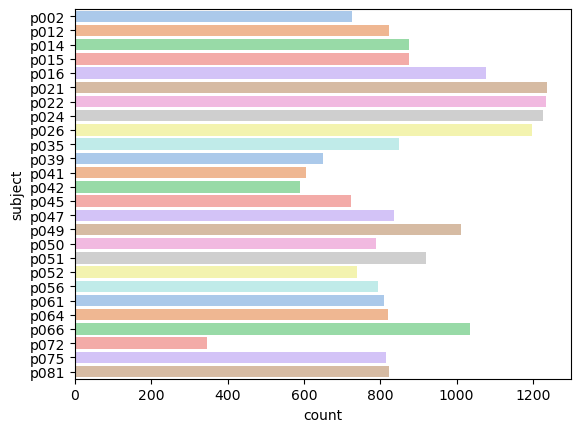

In [3]:
dir = r"F:\BBBBBBBBBBBBBBBBB\Datas"
# dir = "F:\JupyterWorkSpace\BBBBBBS"

driver_imgs_list_csv = os.path.join(dir, "driver_imgs_list.csv")
df = pd.read_csv(driver_imgs_list_csv)
# driver_list = df.groupby('subject', as_index=False)['img'].count()
driver_list = df.groupby('subject')['img'].count()
print(driver_list)
print("drivers count = %d"%len(driver_list))

sns.countplot(y='subject', data=df, orient="h", palette='pastel')
plt.show()

classname
c0    2489
c1    2267
c2    2317
c3    2346
c4    2326
c5    2312
c6    2325
c7    2002
c8    1911
c9    2129
Name: img, dtype: int64
classes count = 10


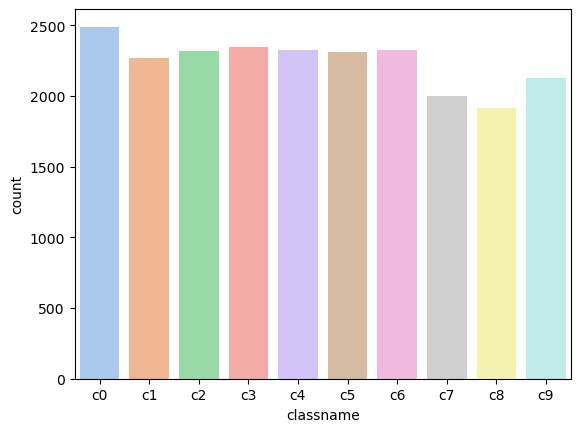

In [4]:
class_list = df.groupby('classname')['img'].count()
print(class_list)
print("classes count = %d"%len(class_list))

sns.countplot(x='classname', data=df,palette='pastel')
plt.show()

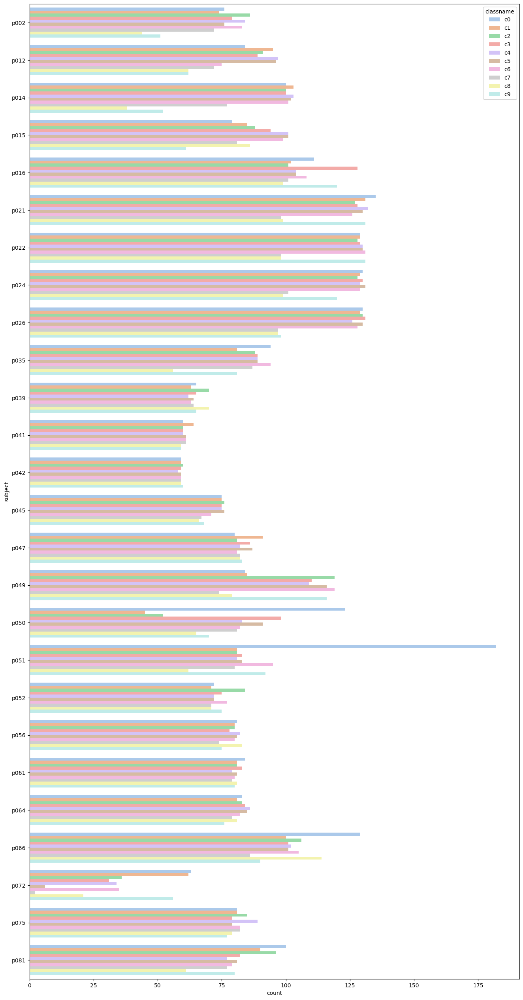

In [5]:
plt.figure(figsize=(16, 32))
sns.countplot(y='subject',  hue='classname', data=df, palette='pastel')
plt.show()

In [10]:
import os
import cv2
import matplotlib.pyplot as plt
import pandas as pd

def show_images(classname):
    # 初始化两个空列表，一个用于存储图片路径，一个用于存储对应的司机信息
    images = []   # 存储图片路径
    drivers = []  # 存储司机信息

    # 遍历所有司机（假设 driver_list 是一个 DataFrame，且 driver_list.index 存储司机的 ID）
    for driver in driver_list.index:
        # 根据司机（driver）和分类名称（classname）从 DataFrame 中筛选出对应的行
        item0 = df[(df["subject"] == driver) & (df["classname"] == classname)].head(1)

        # 检查筛选结果是否为空
        if item0.empty:
            print(f"警告：未找到司机 {driver} 的分类 {classname} 的图片。")
            continue

        # 拼接完整的图像路径
        try:
            image_path = os.path.join(dir, "train", item0["classname"].values[0], item0["img"].values[0])
        except IndexError:
            print(f"错误：无法获取司机 {driver} 的图片路径。")
            continue

        # 检查图片文件是否存在
        if not os.path.exists(image_path):
            print(f"错误：图片文件不存在，路径为 {image_path}。")
            continue

        # 将司机和图片路径添加到相应的列表中
        drivers.append(driver)  # 添加司机信息
        images.append(image_path)    # 添加图片路径

    # 如果没有找到任何图片，直接返回
    if not images:
        print(f"错误：未找到任何分类为 {classname} 的图片。")
        return

    # 创建一个新的图形窗口，指定图形的大小
    plt.figure(figsize=(16, 16))

    # 遍历所有图像路径，逐一显示图片
    for i in range(len(images)):
        # 使用 subplot 函数在 6 行 6 列的网格中显示图像
        plt.subplot(6, 6, i+1)  # 创建一个 6x6 的子图并选定第 i+1 个位置

        # 使用 cv2 读取图片
        img = cv2.imread(images[i])

        # 检查图片是否成功加载
        if img is None:
            print(f"错误：无法加载图片，路径为 {images[i]}。")
            continue

        # 将图像从 BGR 转换为 RGB 格式
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # 设置每个子图的标题为对应的司机信息
        plt.title(drivers[i])

        # 关闭坐标轴显示
        plt.axis('off')

        # 在子图中显示图片
        plt.imshow(img)

    # 最后显示所有图像
    plt.show()

错误：图片文件不存在，路径为 F:\BBBBBBBBBBBBBBBBB\Datas\train\c0\img_31068.jpg。
错误：图片文件不存在，路径为 F:\BBBBBBBBBBBBBBBBB\Datas\train\c0\img_73734.jpg。


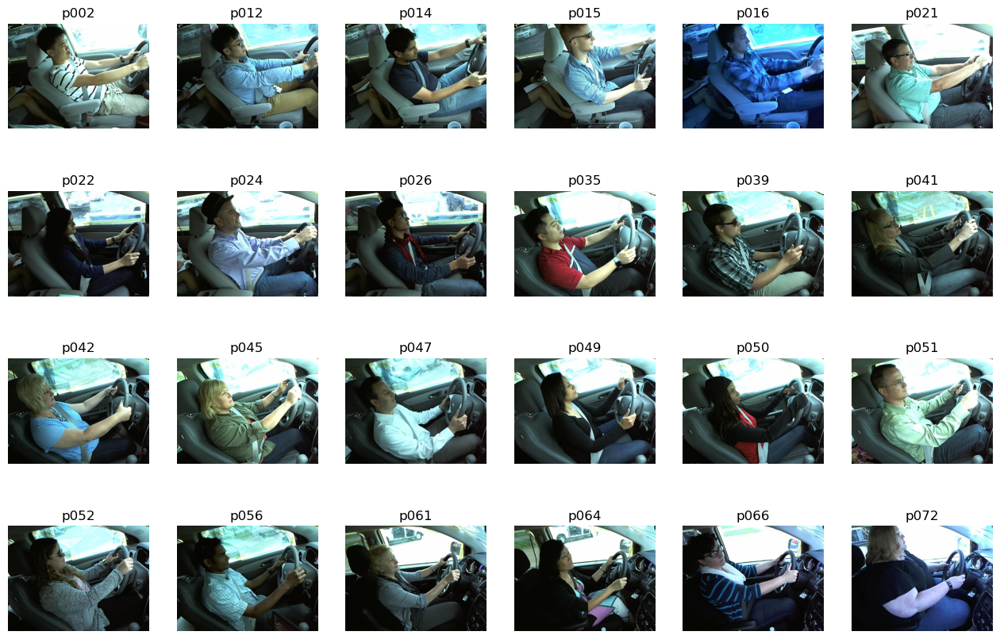

In [11]:
show_images("c0")

错误：图片文件不存在，路径为 F:\BBBBBBBBBBBBBBBBB\Datas\train\c1\img_14298.jpg。
错误：图片文件不存在，路径为 F:\BBBBBBBBBBBBBBBBB\Datas\train\c1\img_79419.jpg。


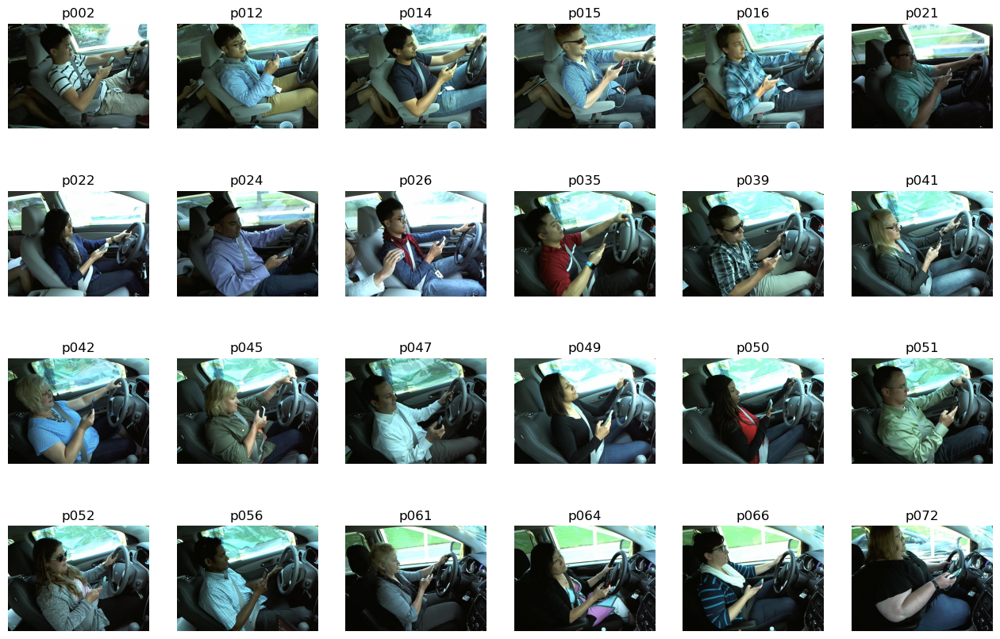

In [12]:
show_images("c1")

错误：图片文件不存在，路径为 F:\BBBBBBBBBBBBBBBBB\Datas\train\c2\img_60999.jpg。
错误：图片文件不存在，路径为 F:\BBBBBBBBBBBBBBBBB\Datas\train\c2\img_24508.jpg。


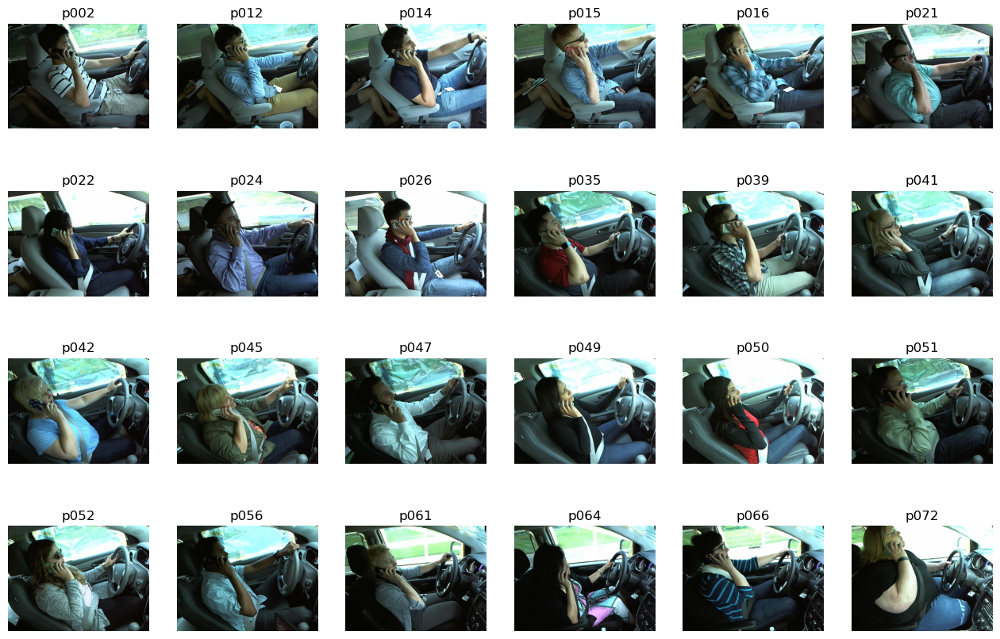

In [13]:
show_images("c2")

错误：图片文件不存在，路径为 F:\BBBBBBBBBBBBBBBBB\Datas\train\c3\img_97182.jpg。
错误：图片文件不存在，路径为 F:\BBBBBBBBBBBBBBBBB\Datas\train\c3\img_89165.jpg。


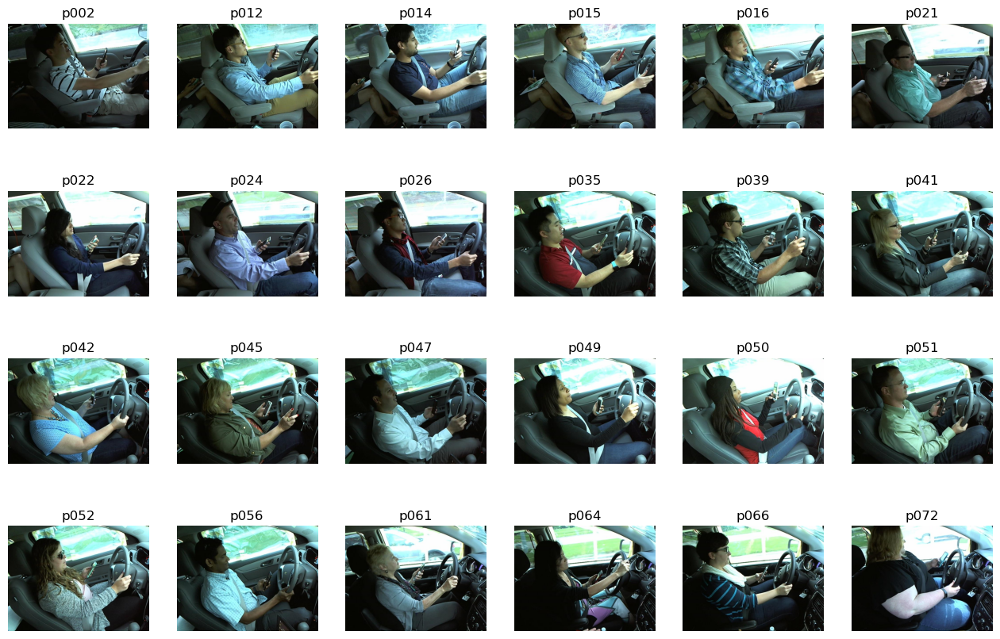

In [14]:
show_images("c3")

错误：图片文件不存在，路径为 F:\BBBBBBBBBBBBBBBBB\Datas\train\c4\img_29986.jpg。
错误：图片文件不存在，路径为 F:\BBBBBBBBBBBBBBBBB\Datas\train\c4\img_6648.jpg。


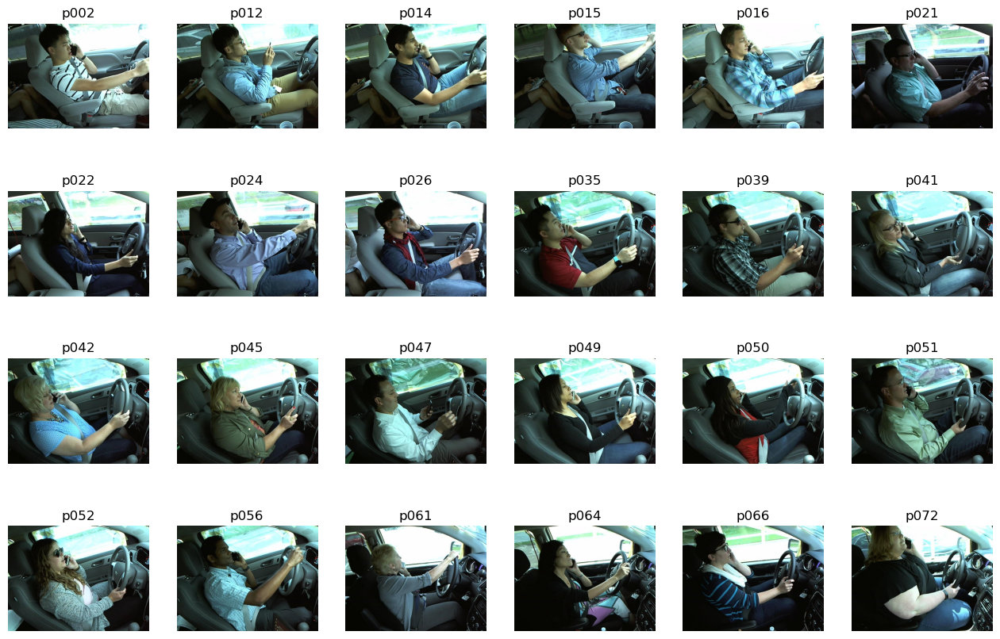

In [15]:
show_images("c4")

错误：图片文件不存在，路径为 F:\BBBBBBBBBBBBBBBBB\Datas\train\c5\img_74238.jpg。
错误：图片文件不存在，路径为 F:\BBBBBBBBBBBBBBBBB\Datas\train\c5\img_75175.jpg。


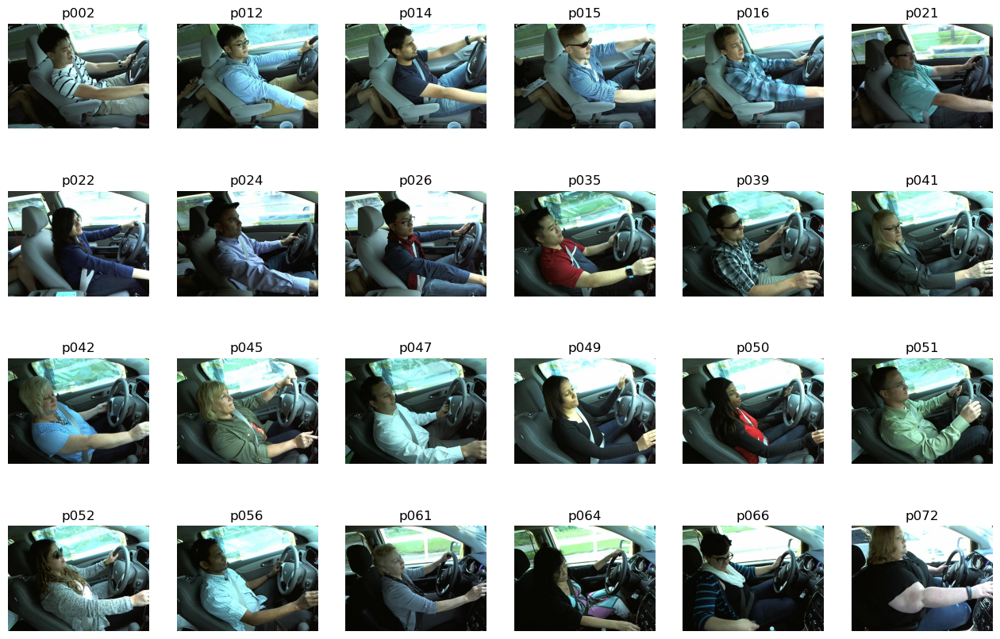

In [16]:
show_images("c5")

错误：图片文件不存在，路径为 F:\BBBBBBBBBBBBBBBBB\Datas\train\c6\img_48804.jpg。
错误：图片文件不存在，路径为 F:\BBBBBBBBBBBBBBBBB\Datas\train\c6\img_58448.jpg。


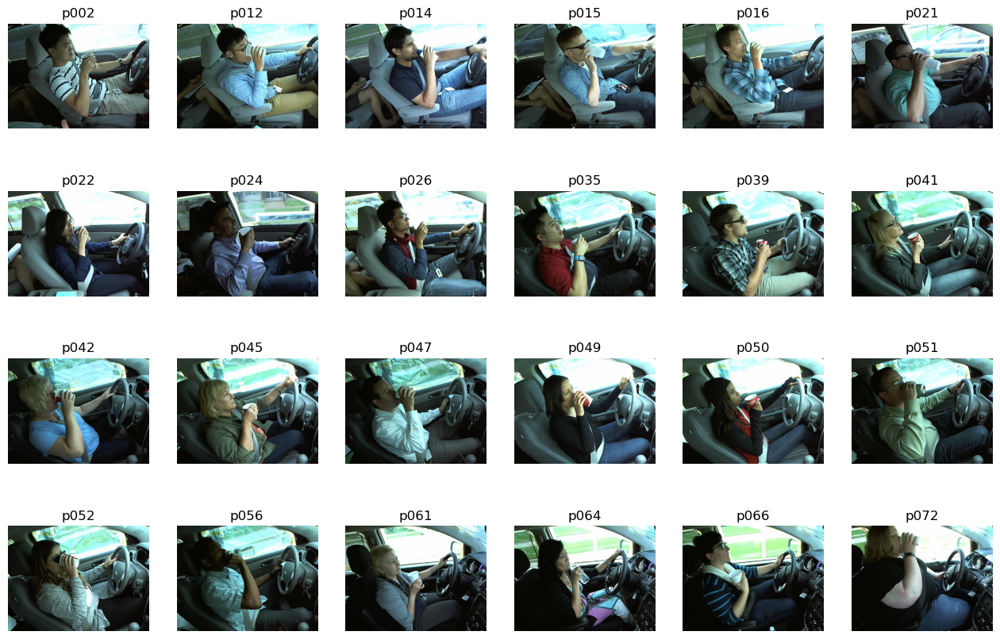

In [17]:
show_images("c6")

错误：图片文件不存在，路径为 F:\BBBBBBBBBBBBBBBBB\Datas\train\c7\img_35473.jpg。
错误：图片文件不存在，路径为 F:\BBBBBBBBBBBBBBBBB\Datas\train\c7\img_4921.jpg。


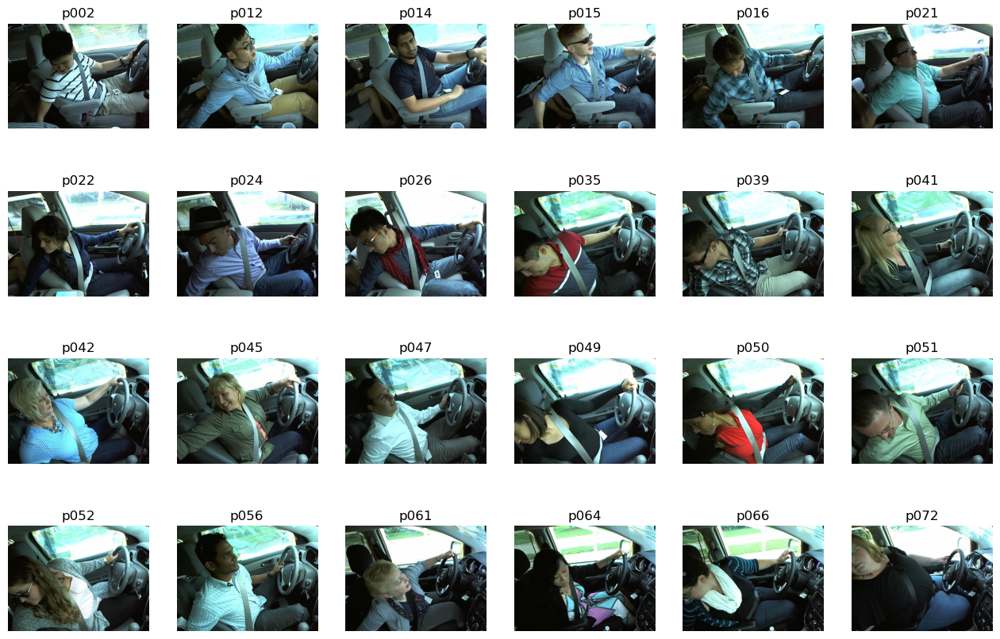

In [18]:
show_images("c7")

错误：图片文件不存在，路径为 F:\BBBBBBBBBBBBBBBBB\Datas\train\c8\img_45868.jpg。
错误：图片文件不存在，路径为 F:\BBBBBBBBBBBBBBBBB\Datas\train\c8\img_80919.jpg。


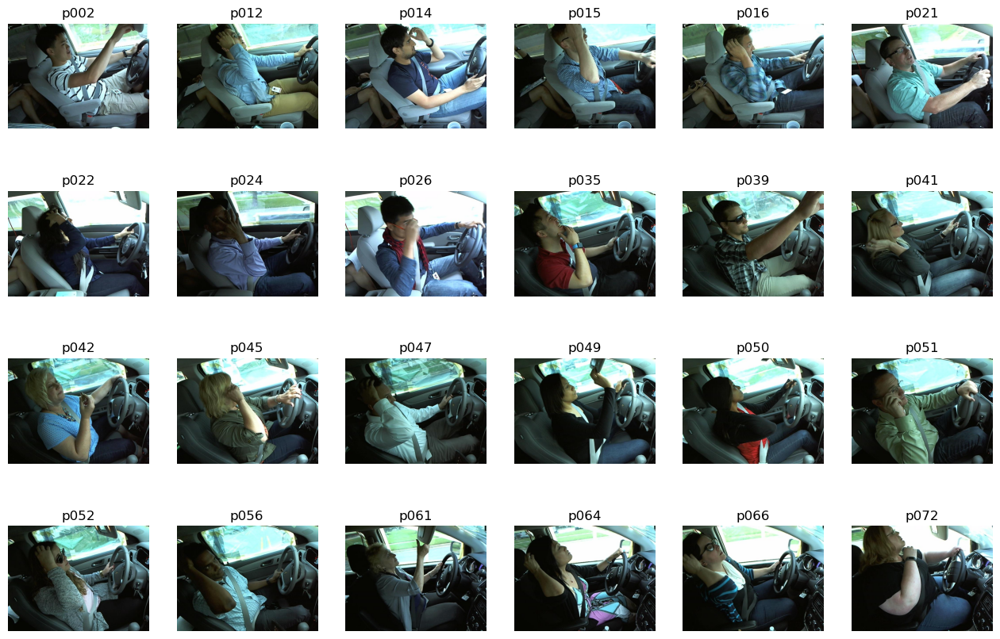

In [19]:
show_images("c8")

错误：图片文件不存在，路径为 F:\BBBBBBBBBBBBBBBBB\Datas\train\c9\img_3854.jpg。
错误：图片文件不存在，路径为 F:\BBBBBBBBBBBBBBBBB\Datas\train\c9\img_34622.jpg。


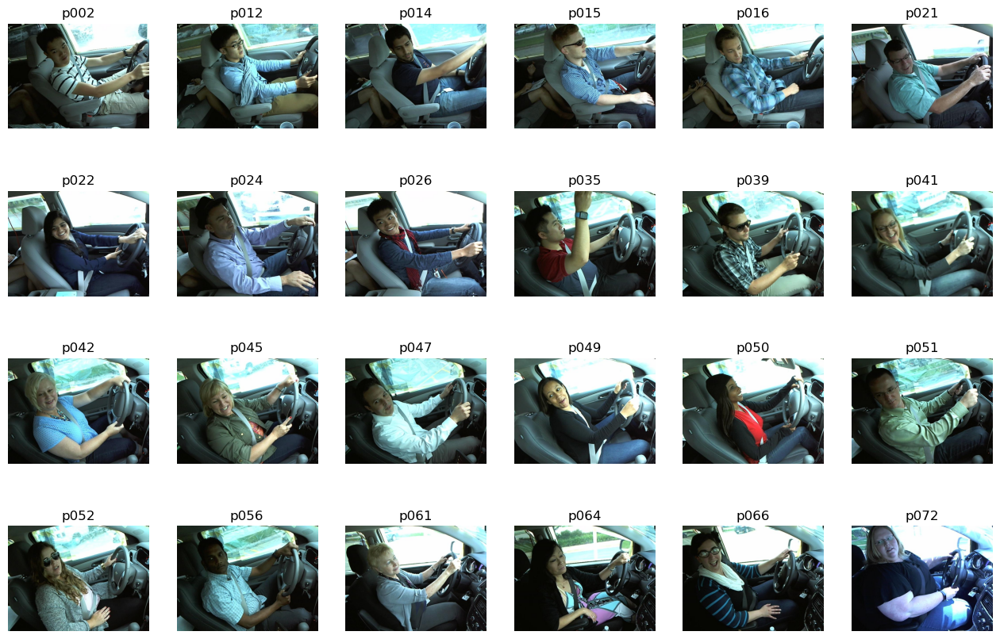

In [20]:
show_images("c9")

## the same driver

20


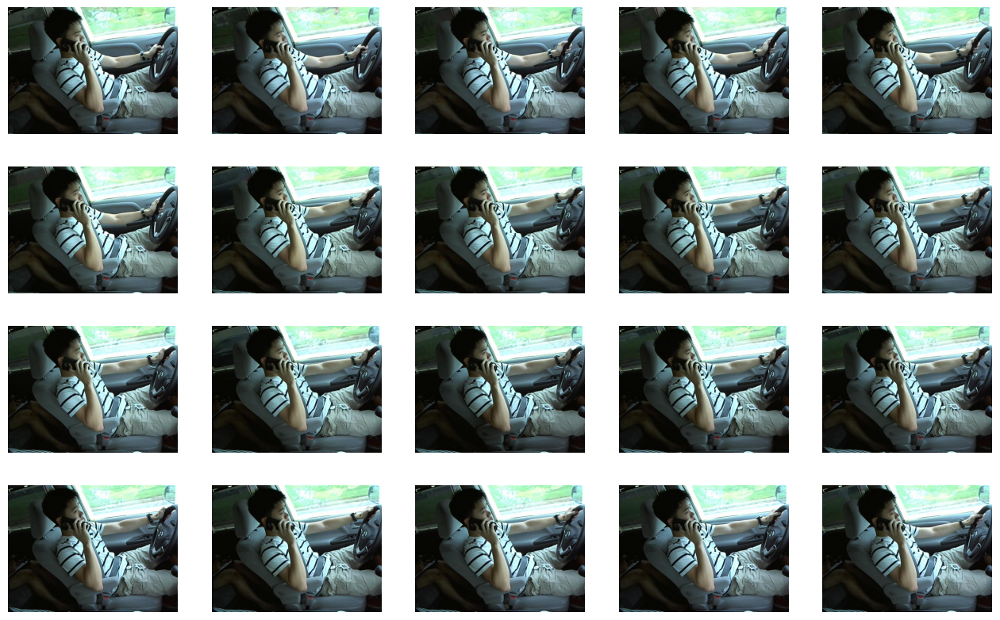

In [21]:
images = []
begin = 200
for i in range(20):# 取20张图片
    item = df[(df["subject"]=="p002")].iloc[begin+i:begin+i+1]
    image = os.path.join(dir,"train",item["classname"].values[0],item["img"].values[0])
    images.append(image)
print(len(images))

plt.figure(figsize=(16, 10))
for i in range(len(images)):
        plt.subplot(4, 5, i+1)
        img = cv2.imread(images[i])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.axis('off')
        plt.imshow(img)

## the test data

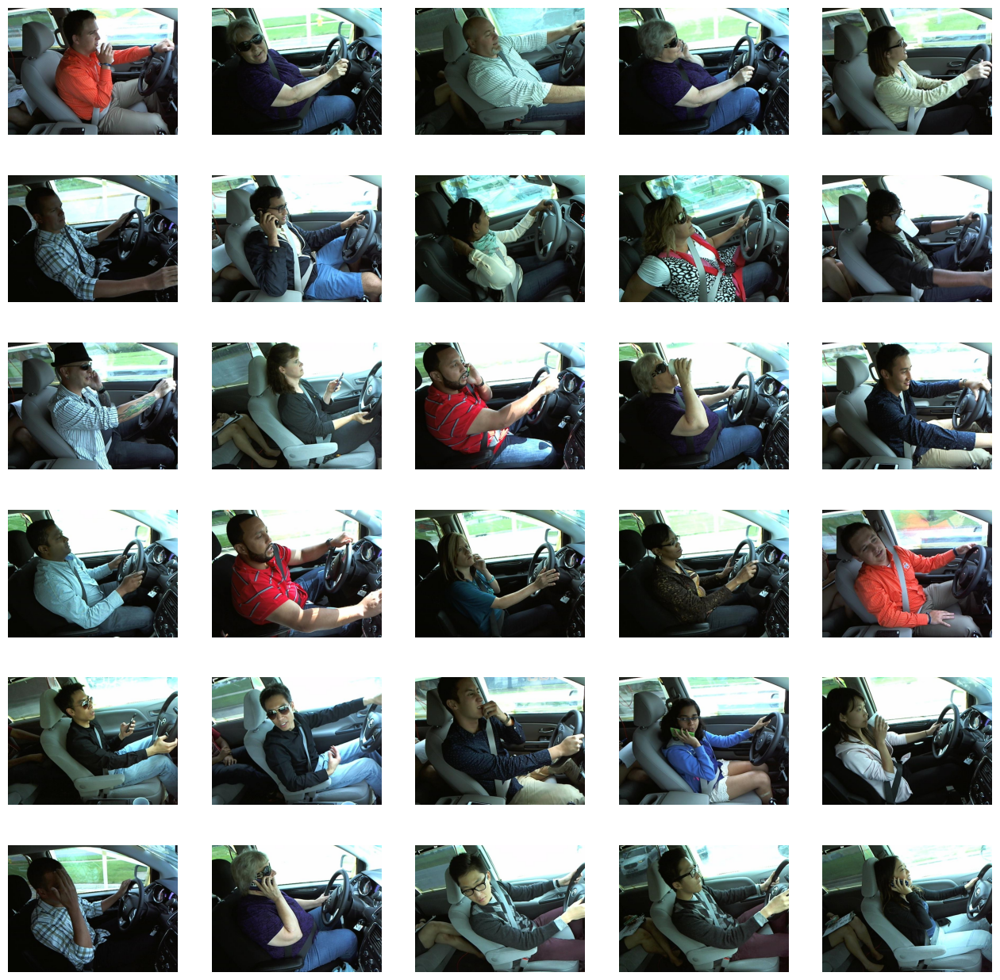

In [22]:
begin = 2000
images = glob.glob(os.path.join(dir, "test/", "*"))[begin:begin+30]

plt.figure(figsize=(16, 16))
for i in range(len(images)):
        plt.subplot(6, 5, i+1)
        img = cv2.imread(images[i])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.axis('off')
        plt.imshow(img)